## Feature engineering

## 2.1a.0 $$BMI = \frac{Mass(kg)}{Height(m)^2}$$

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly_express as px

In [3]:
cardio_dataset = pd.read_csv("../data/cardio_train.csv", delimiter=";")
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [4]:
# Convert age in days to age in years into a new column

cardio_dataset["age_years"] = (cardio_dataset["age"] / (365.25)).round().astype(int)
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,50
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,48
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48


---

In [5]:
# 
px.histogram(cardio_dataset, x='age_years', color='gender', facet_col='cardio',facet_row='cholesterol', facet_col_wrap=3, title='Showing relationship between gender, age, cholesterol and cardiovascular disease in dataset', height=800)

---

Cleaning BMI
- I have checing this article for BMI engineering https://www.healthline.com/health/high-blood-pressure-hypertension#definition
- A BMI of less than 18.5 is considered underweight 
- A search on the internet and on chatGPT(although not the most credible source), A BMI starting from 16 and ending at 42 would fit my dataset

In [6]:
# Calculate the bmi into a new column
cardio_dataset['bmi'] = (cardio_dataset['weight']) / ((cardio_dataset['height']/100) ** 2)
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,50,21.967120
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,48,28.710479
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177


In [7]:
px.scatter(cardio_dataset, x='id', y='bmi', title='BMI distribution before removing outliers')
#sns.scatterplot(cardio_dataset, x='id', y='bmi')

In [8]:
cardio_dataset = cardio_dataset[ (cardio_dataset['bmi'] >= 16)& (cardio_dataset['bmi'] <= 42)]
px.scatter(cardio_dataset,x='id', y='bmi', title='BMI distribution after removing outliers')

___

In [9]:
# Singling out the women dataset
women = cardio_dataset[cardio_dataset['gender'] == 1]

In [10]:
px.scatter(women, y='height', x='id', title='Women weight before removing outliers')

In [11]:
# Singling out men subset dataframe
men = cardio_dataset[cardio_dataset['gender'] == 2]
px.scatter(men, y='height', x='id', title='Men dataframe before removing outliers')


https://www.scb.se/hitta-statistik/artiklar/2018/varannan-svensk-har-overvikt-eller-fetma/

- My source for my reasoning is from the above dataset
- Cleaning my data set is not intended to discrimate any participant with underlying  medical conditions affecting their height, but a person suffering from for example Dwarfism should also have this condition included in the dataset so as not to affect the result. The low heights of some participants might just have errors on depending on where the sample was collected.
- I have only limited my analysis to Sweden when people tend to have a genetic predisposition for their height compared to say Afghanistan.
- standard deviation = 10. There is no standard deviation from my sourse but for analysis reasons i chose 10.


|          |   Längd  |
|----------|:--------:|
| Kninnor  |    166   |
| Men      |    180   |


In [12]:
# Filter out women heights where height is less 140 and more than 180
cardio_dataset = cardio_dataset[((cardio_dataset['gender'] == 2) | ((cardio_dataset['gender'] == 1) & (cardio_dataset['height'] >= 156) & (cardio_dataset['height'] <= 176)))]

In [13]:
# Filter out men heights where height is less 150 and more than 200
cardio_dataset = cardio_dataset[((cardio_dataset['gender'] == 1) | ((cardio_dataset['gender'] == 2) & (cardio_dataset['height'] >= 170) & (cardio_dataset['height'] <= 190)))]

cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588


In [14]:
cardio_dataset['height'].min(), cardio_dataset['height'].max()

(156, 190)

In [15]:
# Filter out women weights where weight is less 140 and more than 180
cardio_dataset = cardio_dataset[((cardio_dataset['gender'] == 2) | ((cardio_dataset['gender'] == 1) & (cardio_dataset['weight'] >=50)))]

In [16]:
# Filter out men weights where weight is less 150 and more than 200
cardio_dataset = cardio_dataset[((cardio_dataset['gender'] == 1) | ((cardio_dataset['gender'] == 2) & (cardio_dataset['weight'] >= 70)))]

cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588


In [17]:
px.scatter(cardio_dataset, y='height', x='id', title='Dataset after handling height outliers for each gender')

---

Create the bmi category

In [18]:
cardio_dataset['bmi'] = (cardio_dataset['weight']) / ((cardio_dataset['height']/100) ** 2)
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588


In [19]:
cardio_dataset['bmi'].min(), cardio_dataset['bmi'].max()

(16.141528925619834, 41.96797520661157)

In [20]:
# cardio_dataset = cardio_dataset[(cardio_dataset['bmi'] < 40)]

In [21]:
cardio_dataset['bmi'].min(), cardio_dataset['bmi'].max()

(16.141528925619834, 41.96797520661157)

In [22]:
# create a new column to specify weight category based on bmi
def weight_category(bmi):
    if bmi < 18.5:
        return 'underweight'
    elif 18.5 <= bmi <= 24.9:
        return 'normal'
    elif 25.0 <= bmi <= 29.9:
        return 'overweight'
    elif 30.0<= bmi <= 34.9:
        return 'obese 1'
    elif 35.0<= bmi <= 39.9:
        return 'obese 2'
    else:
        return 'obese 3'

cardio_dataset['bmi_category'] = cardio_dataset['bmi'].apply(weight_category)

In [23]:
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi,bmi_category
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679,obese 3
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805,normal
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177,normal
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725,obese 2
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588,obese 3


In [24]:
fig = px.box(cardio_dataset, y="bmi", title='Boxplot to display outliers before removing outliers')
fig.show()

In [25]:
cardio_dataset = cardio_dataset[(cardio_dataset['bmi'] >= 0) & (cardio_dataset['bmi'] <= 40)]
fig = px.box(cardio_dataset, y="bmi", title='Boxplot to show outliers after removing outliers')
fig.show()

In [26]:
fig = px.scatter(cardio_dataset, y='bmi', color='bmi_category', title='BMI distribution')
fig.show()

---

## 2.1.1 Feature Engeneering Blood Pressure

- Age | Objective Feature | age | int (days)
- Height | Objective Feature | height | int (cm) |
- Weight | Objective Feature | weight | float (kg) |
- Gender | Objective Feature | gender | categorical code |
- Systolic blood pressure | Examination Feature | ap_hi | int |
- Diastolic blood pressure | Examination Feature | ap_lo | int |
- Cholesterol | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |
- Glucose | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |
- Smoking | Subjective Feature | smoke | binary |
- Alcohol intake | Subjective Feature | alco | binary |
- Physical activity | Subjective Feature | active | binary |
- Presence or absence of cardiovascular disease | Target Variable | cardio | binary |

In [27]:
cardio_dataset['ap_hi'].max(),cardio_dataset['ap_hi'].min(),

(16020, -140)

In [28]:
cardio_dataset['ap_lo'].max(),cardio_dataset['ap_lo'].min(),

(10000, -70)

In [29]:
fig = px.box(cardio_dataset, x="ap_hi", title='Systolic Blood Pressure outliers before clean up' )
fig.show()

In [30]:
fig = px.box(cardio_dataset, x="ap_lo", title='diastolic blood pressure before removing outliers')
fig.show()

- *Extremely high blood pressure can damage blood vessels and weaken arteries in the brain, increasing the risk of stroke. Blood pressure readings above 180/120 mmHg are considered stroke-level, dangerously high, and require immediate medical attention.*
- *https://www.medicinenet.com/what_is_stroke-level_high_blood_pressure/article.htm*

In [31]:
cardio_dataset = cardio_dataset[(cardio_dataset['ap_hi'] >= 90) & (cardio_dataset['ap_hi'] <= 180)]
cardio_dataset = cardio_dataset[(cardio_dataset['ap_lo'] >= 60) & (cardio_dataset['ap_lo'] <= 120)]

cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi,bmi_category
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679,obese 3
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805,normal
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177,normal
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725,obese 2
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588,obese 3


In [32]:
cardio_dataset['ap_lo'].max(),cardio_dataset['ap_lo'].min(),cardio_dataset['ap_hi'].max(),cardio_dataset['ap_hi'].min(),

(120, 60, 180, 90)

In [33]:
fig = px.box(cardio_dataset, x="ap_lo", title='Diastolic blood pressure after removing outliers')
fig.show()

In [34]:
fig = px.box(cardio_dataset, x="ap_hi", title='Systolic blood pressure after removing outliers')
fig.show()

In [35]:
# Here I am defining a function to categorize blood pressure based on systolic(ap_hi) and diastolic(ap_lo) readings
def categorize_bp(row):
    if row['ap_hi'] < 120 and row['ap_lo'] < 80:
        return 'healthy'
    elif 120 <= row['ap_hi'] <= 129 and row['ap_lo'] < 80:
        return 'elevated'
    elif (130 <= row['ap_hi'] <= 139) or (80 <= row['ap_lo'] <= 89):
        return 'stage 1 hyperpetension'
    elif (140 <= row['ap_hi'] <= 180) or (90 <= row['ap_lo'] <= 120):
        return 'stage 2 hyperpetension'
    elif (row['ap_hi'] > 180) or (row['ap_lo'] > 120):
        return 'hypertension crisis'


# Apply the function to create a new column 'blood_pressure'
cardio_dataset['blood_pressure'] = cardio_dataset.apply(categorize_bp, axis=1)

In [36]:
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi,bmi_category,blood_pressure
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679,obese 3,stage 2 hyperpetension
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805,normal,stage 1 hyperpetension
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177,normal,healthy
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725,obese 2,stage 1 hyperpetension
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588,obese 3,stage 1 hyperpetension


In [37]:
cardio_dataset[cardio_dataset['blood_pressure'] == 'hypertension crisis'].head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi,bmi_category,blood_pressure


---

## 2.2.0 Visualisation for portion of sickness

In [38]:
smoke = cardio_dataset.groupby(['smoke', 'cardio']).agg({'id': 'count'}).reset_index()
smoke['cardio'] =smoke['cardio'].replace({0: 'disease absent', 1: 'disease present'})

In [39]:

blood_pressure = cardio_dataset.groupby(['blood_pressure', 'cardio']).agg({'id': 'count'}).reset_index()
blood_pressure['cardio'] = blood_pressure['cardio'].replace({0: 'disease absent', 1: 'disease present'})

In [40]:
bmi = cardio_dataset.groupby(['bmi_category','cardio']).agg({'gender': 'count'}).reset_index()
# bmi['gender'] = bmi['gender'].replace({1: 'women', 2: 'men'})
bmi['cardio'] = bmi['cardio'].replace({0: 'disease absent', 1: 'disease present'})

In [41]:
# Show the existence of cardiovascular disease among the different BMI categories

import plotly.graph_objects as go
from plotly.subplots import make_subplots

px.histogram(data_frame = bmi
             ,x = 'bmi_category', y='gender'
             ,color = 'cardio',title='BMI distribution among patational showing existence of cardiovascular disease'
             )

For memory optimization, only three bar charts are shown demosntrating the relationship between blood pressure, BMI, and smoking among of the participants of the study.

In [60]:

import plotly_express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=2, shared_yaxes=False)
cardio = bmi['cardio'].to_list()
# Add trace 1
trace1 = px.bar(blood_pressure, x="blood_pressure", y="id", color="id", barmode="group")
fig.add_trace(
    go.Bar(
        name="Blood Pressure",
        x=trace1.data[0]["x"],
        y=trace1.data[0]["y"],
        showlegend=True,
        text=[f"BP: {str(val)}" for val in trace1.data[0]["y"]],
        hovertext=[f"{i}-BP: {val}" for i, val in zip(cardio, trace1.data[0]["y"])],
    ),
    row=1,
    col=1,
)

# Add trace 2
trace2 = px.bar(
    bmi,
    x="bmi_category",
    y="gender",
    color="gender",
    barmode="group",
)
fig.add_trace(
    go.Bar(
        name="BMI Gender",
        x=trace2.data[0]["x"],
        y=trace2.data[0]["y"],
        showlegend=True,
        text=[f"BMI: {val}" for val in trace2.data[0]["y"]],
        hovertext=[f"{i}-BMI: {val}" for i, val in zip(cardio, trace2.data[0]["y"])],
    ),
    row=1,
    col=2,
)


# Add trace 3
trace3 = px.bar(smoke, x="smoke", y='id', color="id")
fig.add_trace(
    go.Bar(
        name="BMI Cardio",
        x=trace3.data[0]["x"],
        y=trace3.data[0]["y"],
        
        showlegend=True,
        text=[str(val) for val in trace3.data[0]["x"]],
        hovertext=[f"{i}-Smoke: {val}" for i, val in zip(cardio, trace2.data[0]["y"])],
    ),
    row=2,
    col=1,
)

# Update layout
fig["layout"].update(
    height=1500,
    width=1500,
    title="Blood Pressure and BMI distribution for existence of cardiovascular disease",
    plot_bgcolor="rgba(255,255,255,0.1)",
    paper_bgcolor="rgba(255,255,255,0.9)",
    showlegend=True,
)
fig.update_yaxes(
    tickmode="auto",
    showgrid=False,
    linecolor="#000",
    showline=True,
    spikecolor="#000000",
    title="Participants",
    type="log",
    row=1,
    col=1,
)
fig.update_yaxes(
    tickmode="auto",
    showgrid=False,
    linecolor="#000",
    showline=True,
    spikecolor="#000000",
    title="Participants",
    type="log",
    row=2,
    col=2,
)
fig.update_xaxes(
    tickmode="auto",
    showgrid=False,
    zeroline=True,
    title="Existence of cardiovascular disease within participants in relation to blood pressure",
    linecolor="#000",
    showline=True,
    spikecolor="#000000",
    showticklabels=True,
    row=1,
    col=1,
    tickangle=10,
)
fig.update_xaxes(
    tickmode="auto",
    showgrid=False,
    zeroline=True,
    title="Existence of cardiovascular disease within participants in relation to BMI",
    linecolor="#000",
    showline=True,
    spikecolor="#000000",
    showticklabels=True,
    row=1,
    col=2,
)

fig.update_xaxes(
    tickmode="auto",
    showgrid=False,
    zeroline=True,
    title="Existence of cardiovascular disease within participants in relation to smoking",
    linecolor="#000",
    showline=True,
    spikecolor="#000000",
    showticklabels=True,
    row=2,
    col=1,

 

)
fig.show()


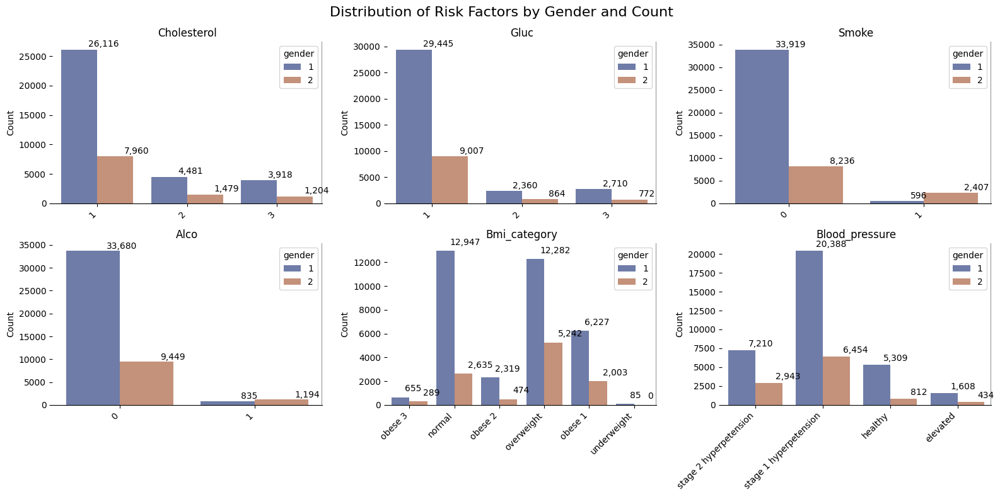

In [94]:
columns_of_interest = [
    "cholesterol",
    "gluc",
    "smoke",
    "alco",
    "bmi_category",
    "blood_pressure",
]

fig, axes = plt.subplots(2, 3, figsize=(16, 8))


for i, ax in zip(columns_of_interest, axes.flatten()):
    sns.countplot(
        data=cardio_dataset,
        x=i,
        hue="gender",
        palette="dark",
        alpha=.6,
        ax=ax,
    )
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
    sns.despine(left=True)
    ax.set_xlabel("")
    ax.set_ylabel("Count")
    ax.set_title(i.capitalize())

    # Add count text
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height()):,}', (p.get_x()+0.3, p.get_height()+500))
    # Add line to demarcate each plot
    ax.axvline(x=ax.get_xlim()[1], color='grey', lw=2)
fig.suptitle("Distribution of Risk Factors by Gender and Count", fontsize=16)
fig.tight_layout()


In [43]:
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi,bmi_category,blood_pressure
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679,obese 3,stage 2 hyperpetension
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805,normal,stage 1 hyperpetension
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177,normal,healthy
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725,obese 2,stage 1 hyperpetension
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588,obese 3,stage 1 hyperpetension


---

## 2.2.1 Visualisation correlation heatmap

In [44]:
import numpy as np
import plotly.figure_factory as ff

columns = ['gender', 'age', 'height', 'weight', 'ap_hi', 'ap_lo', 'cholesterol', 'gluc', 'smoke', 'alco', 'cardio', 'bmi']

corr = cardio_dataset[columns].corr().round(4)
mask = np.triu(np.ones_like(corr, dtype=bool))
df_mask = corr.mask(mask)

fig = ff.create_annotated_heatmap(z=df_mask.to_numpy(), 
                                  x=df_mask.columns.tolist(),
                                  y=df_mask.columns.tolist(),
                                  colorscale=px.colors.diverging.RdBu,
                                  showscale=True, ygap=1, xgap=1
                                 )

fig.update_xaxes(side="bottom")

fig.update_layout(
    title_text='Heatmap for some features in dataframe', 
    title_x=0.1, 
    width=1000, 
    height=800,
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis_zeroline=False,
    yaxis_zeroline=False,
    yaxis_autorange='reversed',
    template='plotly_white'
    
)

fig.show()

### From the diagram above, I can observe some trends like:

- BMI is strongly correlated to weight, this is because the the higher the weight, the higher the BMI.

- Smoking has a weak correlation to weight, this can be explained as most people who smoke tend to eat less and often poor eating habbits.

- Systolic and diastolic blood pressures are positively correlated

- Systolic and diastolic blood pressres are weakly positively correlated to weight

- Alcohol consumption has weakly positive correlation to weight

---

## 2.3 Create Two datasets

In [45]:
cardio_dataset.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi,bmi_category,blood_pressure
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,55,34.927679,obese 3,stage 2 hyperpetension
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,52,23.507805,normal,stage 1 hyperpetension
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,48,23.011177,normal,healthy
6,9,22113,1,157,93.0,130,80,3,1,0,0,1,0,61,37.729725,obese 2,stage 1 hyperpetension
7,12,22584,2,178,95.0,130,90,3,3,0,0,1,1,62,29.983588,obese 3,stage 1 hyperpetension


In [46]:
cardio_dataset['alco'].max()

1

In [47]:
dataset_1 = cardio_dataset.drop(['ap_hi', 'ap_lo', 'height', 'weight', 'bmi'], axis=1)
dataset_1.head()

,id,age,gender,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi_category,blood_pressure
1,1,20228,1,3,1,0,0,1,1,55,obese 3,stage 2 hyperpetension
2,2,18857,1,3,1,0,0,0,1,52,normal,stage 1 hyperpetension
4,4,17474,1,1,1,0,0,0,0,48,normal,healthy
6,9,22113,1,3,1,0,0,1,0,61,obese 2,stage 1 hyperpetension
7,12,22584,2,3,3,0,0,1,1,62,obese 3,stage 1 hyperpetension


In [48]:
dataset_1['gender'] = dataset_1['gender'].replace({1: 'women', 2: 'men'})
dataset_1.head()

,id,age,gender,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi_category,blood_pressure
1,1,20228,women,3,1,0,0,1,1,55,obese 3,stage 2 hyperpetension
2,2,18857,women,3,1,0,0,0,1,52,normal,stage 1 hyperpetension
4,4,17474,women,1,1,0,0,0,0,48,normal,healthy
6,9,22113,women,3,1,0,0,1,0,61,obese 2,stage 1 hyperpetension
7,12,22584,men,3,3,0,0,1,1,62,obese 3,stage 1 hyperpetension


In [49]:
dataset_1 = pd.get_dummies(dataset_1, columns = ["bmi_category", "blood_pressure", 'gender'], drop_first=True)
dataset_1.head()

,id,age,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi_category_obese 1,bmi_category_obese 2,bmi_category_obese 3,bmi_category_overweight,bmi_category_underweight,blood_pressure_healthy,blood_pressure_stage 1 hyperpetension,blood_pressure_stage 2 hyperpetension,gender_women
1,1,20228,3,1,0,0,1,1,55,0,0,1,0,0,0,0,1,1
2,2,18857,3,1,0,0,0,1,52,0,0,0,0,0,0,1,0,1
4,4,17474,1,1,0,0,0,0,48,0,0,0,0,0,1,0,0,1
6,9,22113,3,1,0,0,1,0,61,0,1,0,0,0,0,1,0,1
7,12,22584,3,3,0,0,1,1,62,0,0,1,0,0,0,1,0,0


In [50]:
dataset_1.columns

Index(['id', 'age', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio',
       'age_years', 'bmi_category_obese 1', 'bmi_category_obese 2',
       'bmi_category_obese 3', 'bmi_category_overweight',
       'bmi_category_underweight', 'blood_pressure_healthy',
       'blood_pressure_stage 1 hyperpetension',
       'blood_pressure_stage 2 hyperpetension', 'gender_women'],
      dtype='object')

In [51]:
dataset_2 = cardio_dataset.drop(['bmi_category', 'blood_pressure', 'height', 'weight'], axis=1)
dataset_2.head()

,id,age,gender,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi
1,1,20228,1,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,1,130,70,3,1,0,0,0,1,52,23.507805
4,4,17474,1,100,60,1,1,0,0,0,0,48,23.011177
6,9,22113,1,130,80,3,1,0,0,1,0,61,37.729725
7,12,22584,2,130,90,3,3,0,0,1,1,62,29.983588


In [52]:
dataset_2['gender'] = dataset_2['gender'].replace({1: 'women', 2: 'men'})
dataset_2.head()

,id,age,gender,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi
1,1,20228,women,140,90,3,1,0,0,1,1,55,34.927679
2,2,18857,women,130,70,3,1,0,0,0,1,52,23.507805
4,4,17474,women,100,60,1,1,0,0,0,0,48,23.011177
6,9,22113,women,130,80,3,1,0,0,1,0,61,37.729725
7,12,22584,men,130,90,3,3,0,0,1,1,62,29.983588


In [53]:
dataset_2 = pd.get_dummies(dataset_2, columns = ['gender'], drop_first=True)
dataset_2.head()

,id,age,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_years,bmi,gender_women
1,1,20228,140,90,3,1,0,0,1,1,55,34.927679,1
2,2,18857,130,70,3,1,0,0,0,1,52,23.507805,1
4,4,17474,100,60,1,1,0,0,0,0,48,23.011177,1
6,9,22113,130,80,3,1,0,0,1,0,61,37.729725,1
7,12,22584,130,90,3,3,0,0,1,1,62,29.983588,0


In [54]:
dataset_1.to_csv('../data/cleaned_dataset_1.csv', index=False)
dataset_2.to_csv('../data/cleaned_dataset_2.csv', index=False)

---